# Spotify Genre Classification EDA

## Initializations

In [156]:
%matplotlib inline
import time
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
from dotenv import load_dotenv
from plotly.subplots import make_subplots
from sklearn.preprocessing import LabelEncoder , label_binarize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification

In [38]:
os.environ["SPOTIPY_CACHE"] = "/tmp/spotipy_cache"  # or any valid writable path

In [40]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.exceptions import SpotifyException

try:
    load_dotenv()
    
    client_id = os.getenv('SPOTIPY_CLIENT_ID')
    client_secret = os.getenv('SPOTIPY_CLIENT_SECRET')
    
    client_credentials_manager = SpotifyClientCredentials(
        client_id=client_id,
        client_secret=client_secret
    )
    
    sp = spotipy.Spotify(auth=client_credentials_manager.get_access_token(as_dict=False))

    # Test
    result = sp.search(q='breath away', type='track', limit=1)
    result
except e:
    print('Client credentials were not established or the service has experienced too many API calls.')

## Data Loading and Preprocessing

In [42]:
import kagglehub
from kagglehub import KaggleDatasetAdapter

# Load the dataset as a pandas DataFrame
df = kagglehub.load_dataset(
    KaggleDatasetAdapter.PANDAS,
    "iamsumat/spotify-top-2000s-mega-dataset",
    "Spotify-2000.csv",  # Replace with the correct file name from the dataset
)

# Display the first 5 records
print("First 5 records:")
df.head()

First 5 records:


,Index,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity
0,1,Sunrise,Norah Jones,adult standards,2004,157,30,53,-14,11,68,201,94,3,71
1,2,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39
2,3,Clint Eastwood,Gorillaz,alternative hip hop,2001,168,69,66,-9,7,52,341,2,17,69
3,4,The Pretender,Foo Fighters,alternative metal,2007,173,96,43,-4,3,37,269,0,4,76
4,5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,106,82,58,-5,10,87,256,1,3,59


In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1994 entries, 0 to 1993
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Index                   1994 non-null   int64 
 1   Title                   1994 non-null   object
 2   Artist                  1994 non-null   object
 3   Top Genre               1994 non-null   object
 4   Year                    1994 non-null   int64 
 5   Beats Per Minute (BPM)  1994 non-null   int64 
 6   Energy                  1994 non-null   int64 
 7   Danceability            1994 non-null   int64 
 8   Loudness (dB)           1994 non-null   int64 
 9   Liveness                1994 non-null   int64 
 10  Valence                 1994 non-null   int64 
 11  Length (Duration)       1994 non-null   object
 12  Acousticness            1994 non-null   int64 
 13  Speechiness             1994 non-null   int64 
 14  Popularity              1994 non-null   int64 
dtypes: i

In [44]:
df.index = df['Index']
df = df.drop(columns='Index')
df.head()

,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity
Index,,,,,,,,,,,,,,
1,Sunrise,Norah Jones,adult standards,2004,157,30,53,-14,11,68,201,94,3,71
2,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39
3,Clint Eastwood,Gorillaz,alternative hip hop,2001,168,69,66,-9,7,52,341,2,17,69
4,The Pretender,Foo Fighters,alternative metal,2007,173,96,43,-4,3,37,269,0,4,76
5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,106,82,58,-5,10,87,256,1,3,59


In [46]:
df.describe()

,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Acousticness,Speechiness,Popularity
count,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.00000
mean,1992.992979,120.215647,59.679539,53.238215,-9.008526,19.012036,49.408726,28.858074,4.994985,59.52658
std,16.116048,28.028096,22.154322,15.351507,3.647876,16.727378,24.858212,29.011986,4.401566,14.35160
min,1956.000000,37.000000,3.000000,10.000000,-27.000000,2.000000,3.000000,0.000000,2.000000,11.00000
25%,1979.000000,99.000000,42.000000,43.000000,-11.000000,9.000000,29.000000,3.000000,3.000000,49.25000
50%,1993.000000,119.000000,61.000000,53.000000,-8.000000,12.000000,47.000000,18.000000,4.000000,62.00000
75%,2007.000000,136.000000,78.000000,64.000000,-6.000000,23.000000,69.750000,50.000000,5.000000,71.00000
max,2019.000000,206.000000,100.000000,96.000000,-2.000000,99.000000,99.000000,99.000000,55.000000,100.00000


In [47]:
df.describe(include='object')

,Title,Artist,Top Genre,Length (Duration)
count,1994,1994,1994,1994
unique,1958,731,149,350
top,One,Queen,album rock,215
freq,3,37,413,23


Length (Duration) needs to be typed as an int. There are 149 unique values for 'Top Genre', 731 unique values for 'Artist', and 1958 unique values for 'Title'. Since we're exploring the statistics and data for unique genres we should limit the genres to the most popular genres or provide widgets that can toggle the number of genres.

In [49]:
df.duplicated().sum()

0

In [50]:
df.isna().sum()

Title                     0
Artist                    0
Top Genre                 0
Year                      0
Beats Per Minute (BPM)    0
Energy                    0
Danceability              0
Loudness (dB)             0
Liveness                  0
Valence                   0
Length (Duration)         0
Acousticness              0
Speechiness               0
Popularity                0
dtype: int64

In [51]:
df.sample(10, random_state=42)

,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity
Index,,,,,,,,,,,,,,
890,Time In A Bottle,Jim Croce,adult standards,1972,134,26,54,-12,15,64,148,85,3,58
1673,Ik Leef Niet Meer Voor Jou,Marco Borsato,dutch cabaret,1995,150,82,55,-9,4,57,217,2,5,60
415,A Night Like This,Caro Emerald,dutch pop,2010,123,71,87,-6,10,96,226,57,4,40
1600,Rhythm Is A Dancer,SNAP!,diva house,1992,124,65,76,-15,9,86,332,21,3,57
850,Wild Horses,The Rolling Stones,album rock,1971,140,39,43,-7,8,16,342,69,3,72
1659,Streets of Philadelphia - Single Edit,Bruce Springsteen,classic rock,1995,94,29,74,-13,9,44,195,29,3,70
927,Tequila Sunrise - 2013 Remaster,Eagles,album rock,1973,111,40,63,-13,11,73,173,54,3,62
1671,Lemon Tree,Fools Garden,german pop rock,1995,143,48,66,-9,12,64,191,64,4,73
1449,Ich bin wie du,Marianne Rosenberg,classic schlager,1988,129,74,48,-10,5,60,218,1,8,45


In [52]:
df['Length (Duration)'].unique()

array(['201', '207', '341', '269', '256', '247', '257', '366', '223',
       '290', '162', '232', '214', '639', '173', '236', '288', '276',
       '352', '296', '218', '176', '197', '261', '270', '298', '259',
       '306', '310', '211', '186', '185', '264', '202', '263', '266',
       '629', '177', '237', '278', '331', '355', '213', '234', '216',
       '275', '467', '243', '219', '305', '215', '144', '195', '240',
       '357', '297', '281', '273', '212', '279', '249', '229', '394',
       '375', '226', '210', '258', '283', '231', '268', '403', '321',
       '217', '308', '206', '208', '242', '326', '199', '225', '193',
       '302', '294', '238', '433', '324', '154', '245', '248', '311',
       '272', '289', '253', '181', '184', '203', '280', '146', '196',
       '204', '602', '353', '189', '423', '233', '135', '141', '241',
       '262', '346', '319', '284', '501', '287', '170', '187', '171',
       '414', '252', '209', '364', '246', '235', '161', '274', '286',
       '172', '404',

In [53]:
pd.to_numeric(df['Length (Duration)'], errors='coerce').isna().sum()

4

When these strings are forced into numeric types, four NaNs result from that method.

In [58]:
df['Length (Duration)'] = df['Length (Duration)'].str.replace(',','')

In [61]:
df['Length (Duration)'].unique()

array(['201', '207', '341', '269', '256', '247', '257', '366', '223',
       '290', '162', '232', '214', '639', '173', '236', '288', '276',
       '352', '296', '218', '176', '197', '261', '270', '298', '259',
       '306', '310', '211', '186', '185', '264', '202', '263', '266',
       '629', '177', '237', '278', '331', '355', '213', '234', '216',
       '275', '467', '243', '219', '305', '215', '144', '195', '240',
       '357', '297', '281', '273', '212', '279', '249', '229', '394',
       '375', '226', '210', '258', '283', '231', '268', '403', '321',
       '217', '308', '206', '208', '242', '326', '199', '225', '193',
       '302', '294', '238', '433', '324', '154', '245', '248', '311',
       '272', '289', '253', '181', '184', '203', '280', '146', '196',
       '204', '602', '353', '189', '423', '233', '135', '141', '241',
       '262', '346', '319', '284', '501', '287', '170', '187', '171',
       '414', '252', '209', '364', '246', '235', '161', '274', '286',
       '172', '404',

In [65]:
pd.to_numeric(df['Length (Duration)'], errors='raise')

Index
1       201
2       207
3       341
4       269
5       256
       ... 
1990    128
1991    136
1992    162
1993    324
1994    148
Name: Length (Duration), Length: 1994, dtype: int64

In [69]:
print(df['Length (Duration)'].sort_values(ascending=False).values, end=' ')

['966' '93' '859' ... '1121' '108' '102'] 

In [71]:
df['Length (Duration)'].dtype

dtype('O')

In [73]:
df.loc[1050,'Length (Duration)']

'93'

In [76]:
pd.to_numeric(df['Length (Duration)'], errors='raise').astype(str).eq(df['Length (Duration)']).all()

True

We have confirmation that changing the df['Length (Duration)'] into ints will not change any of the values, just the datatypes.

In [80]:
df['Length (Duration)'] = pd.to_numeric(df['Length (Duration)'], errors='coerce')

In [81]:
df['Length (Duration)'].isna().sum()

0

## Text Based Grouping via NLP

In [85]:
#Number of categories is excessive.  link related ones together. 
# Extract unique genres
unique_genres = df['Top Genre'].unique()

# Convert genre text into TF-IDF vectors
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(unique_genres)

# Cluster genre names into broader groups
n_clusters = 5  
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(X)

#Map original genres to cluster numbers
genre_to_cluster = dict(zip(unique_genres, cluster_labels))
df['Genre Cluster ID'] = df['Top Genre'].map(genre_to_cluster)

In [86]:
# See which genres were grouped together
genre_clusters = pd.DataFrame({'Genre': unique_genres, 'Cluster': cluster_labels})
for i in range(n_clusters):
    print(f"\nCluster {i}:")
    print(genre_clusters[genre_clusters['Cluster'] == i]['Genre'].tolist())


Cluster 0:
['acid jazz', 'contemporary vocal jazz', 'latin jazz']

Cluster 1:
['adult standards', 'alternative hip hop', 'pop', 'detroit hip hop', 'dutch indie', 'dutch cabaret', 'permanent wave', 'classic uk pop', 'dance pop', 'dutch pop', 'dutch americana', 'german pop', 'afropop', 'disco', 'big room', 'britpop', 'boy band', 'carnaval limburg', 'arkansas country', 'british folk', 'celtic', 'chanson', 'hip pop', 'east coast hip hop', 'electro', 'australian pop', 'downtempo', 'reggae fusion', 'british invasion', 'canadian pop', 'bow pop', 'dutch hip hop', 'acoustic pop', 'dutch prog', 'candy pop', 'operatic pop', 'trance', 'scottish singer-songwriter', 'mellow gold', 'atl hip hop', 'eurodance', 'blues', 'canadian folk', 'big beat', 'art pop', 'uk pop', 'brill building pop', 'g funk', 'happy hardcore', 'belgian pop', 'classic schlager', 'contemporary country', 'barbadian pop', 'gabba', 'chamber pop', 'british singer-songwriter', 'indie pop', 'nederpop', 'australian indie folk', 'folk-p

In [87]:
#reviewed created clusters.  correct some errors
genre_to_cluster['alternative dance', 'latin alternative','alternative pop', 'alterrnative country'] = 1 

In [88]:
# Label clusters based on inspection of what genres fell into each
cluster_id_to_name = {
    0: 'Jazz',
    1: 'Pop',
    2: 'Rock',
    3: 'Soul',
    4: 'Metal'
}

In [89]:
# Reapply the mapping
df['Genre Cluster ID'] = df['Top Genre'].map(genre_to_cluster)
df['Genre Group'] = df['Genre Cluster ID'].map(cluster_id_to_name)

In [90]:
# Create final human-readable cluster label
df['Genre Group'] = df['Genre Cluster ID'].map(cluster_id_to_name)

In [91]:
df.head()

,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity,Genre Cluster ID,Genre Group
Index,,,,,,,,,,,,,,,,
1,Sunrise,Norah Jones,adult standards,2004,157,30,53,-14,11,68,201,94,3,71,1,Pop
2,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39,2,Rock
3,Clint Eastwood,Gorillaz,alternative hip hop,2001,168,69,66,-9,7,52,341,2,17,69,1,Pop
4,The Pretender,Foo Fighters,alternative metal,2007,173,96,43,-4,3,37,269,0,4,76,4,Metal
5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,106,82,58,-5,10,87,256,1,3,59,2,Rock


## EDA

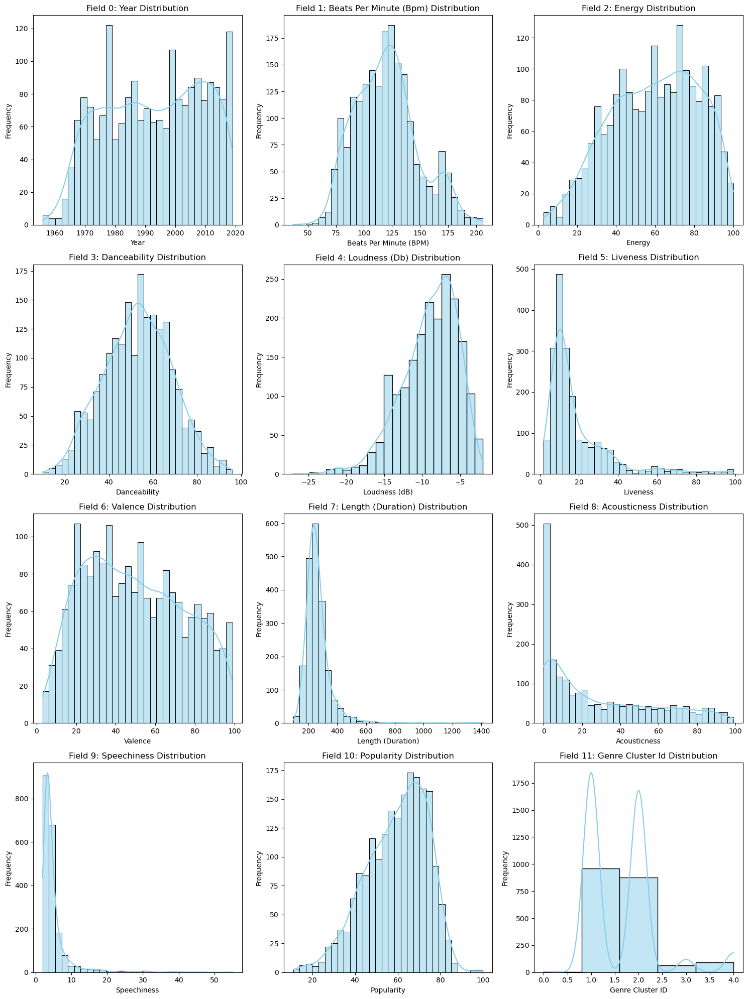

In [99]:
# Get all numeric column names
numeric_columns = df.select_dtypes(include=['number']).columns  # Select only numeric columns

# Set up the number of rows and columns for subplots
n = len(numeric_columns)
cols = 3  # Number of columns for subplots
rows = (n + cols - 1) // cols  # Calculate the number of rows needed

# Create the figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()  # Flatten the axes array to make it easier to iterate
i = 0 

# Plot a histogram for each numeric column
for i, col in enumerate(numeric_columns):
    bins = 30
    if df[col].unique().sum() < bins and df[col].nunique() >= 1:
        bins = df[col].nunique()
    sns.histplot(df[col], kde=True, ax=axes[i], bins=bins, color='skyblue', edgecolor='black')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Field {i}: {col.title()} Distribution')

# Hide any extra subplots if the numeric columns are not divisible by three.
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout to ensure there's no overlap
plt.tight_layout()

# Show the figure
plt.show()

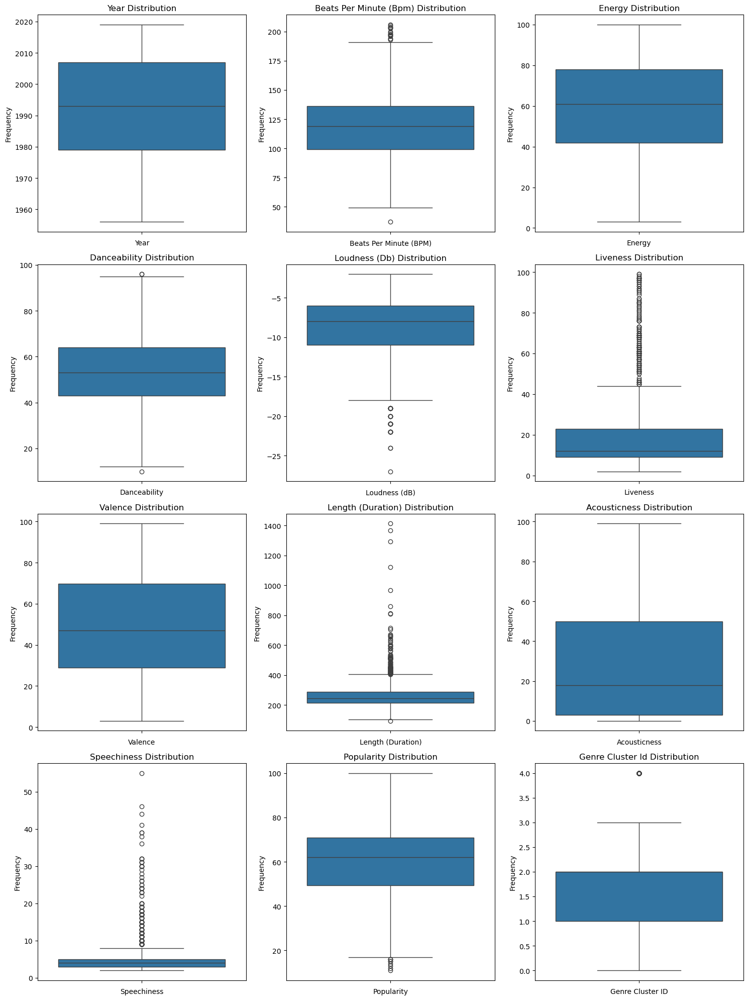

In [101]:
numeric_columns = df.select_dtypes(include=[np.number]).columns  # Select only numeric columns

# Set up the number of rows and columns for subplots
n = len(numeric_columns)
cols = 3  # Number of columns for subplots
rows = (n + cols - 1) // cols  # Calculate the number of rows needed

# Create the figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()  # Flatten the axes array to make it easier to iterate

# Plot a boxplot for each numeric column
for i, col in enumerate(numeric_columns):
    sns.boxplot(df[col], ax=axes[i], patch_artist=True)  # Specify ax for each boxplot
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'{col.title()} Distribution')
    
# Hide any extra subplots if the numeric columns are not divisible by three.
for j in range(i + 1, len(axes)):
   axes[j].axis('off')

# Adjust the layout to ensure there's no overlap
plt.tight_layout()

# Show the figure
plt.show()

We do have outliers in the dataset, but given that the data was selected based on the popularity of these songs on the Spotify streaming platform, outliers are likely to be representative of different eras or genres of music. They do not represent a problem with the way the data was collected and do not need to be removed at this point.

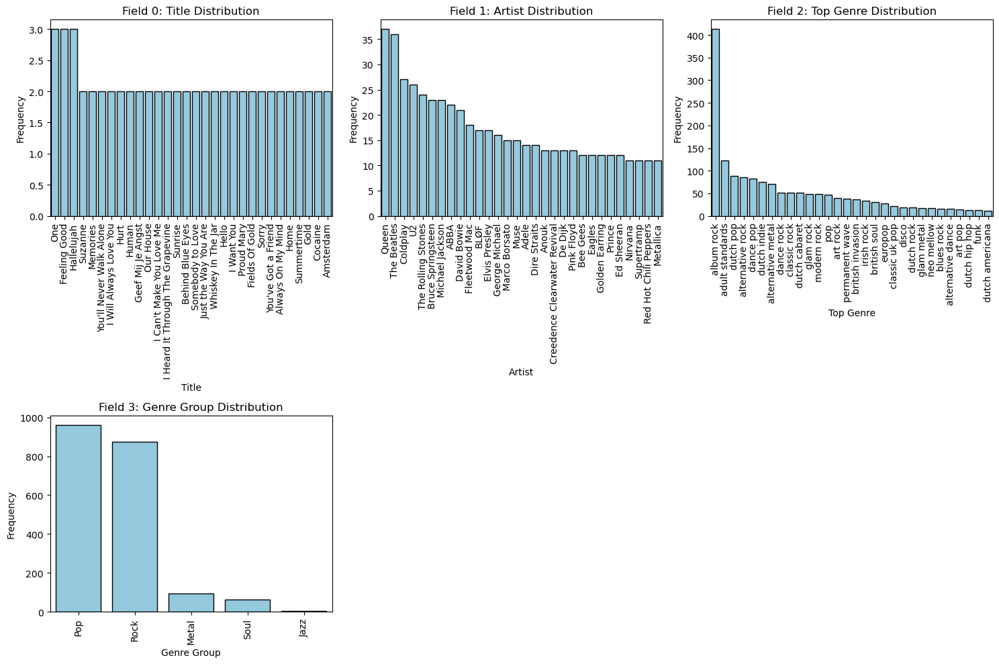

In [103]:
# We do not want to plot endless or referencial text like links.
top_n = 30  # Top N values to display

# Get object columns only from the selected ones
object_columns = df.select_dtypes(include=['object']).columns  # Select only object columns

# Set up the number of rows and columns for subplots
n = len(object_columns)
cols = 3
rows = (n + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()

# Plot count plots for each object column
for i, col in enumerate(object_columns):
    top_values = df[col].value_counts(ascending=False).nlargest(top_n).index
    filtered_df = df[df[col].isin(top_values)].sort_values(col, ascending=False)
    
    sns.countplot(data=filtered_df, x=col, ax=axes[i], color='skyblue', edgecolor='black', order=top_values)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Field {i}: {col.title()} Distribution')
    axes[i].tick_params(axis='x', rotation=90)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

These plots represent the various frequencies of the strings in the dataset. As a field, 'Title' isn't very useful, but 'Artist' and 'Top Genre' are at very least informative. Given that the 'Top Genre' will be the target for our ML models, the high class imbalance between 'Album Rock' and the rest of the dataset could be quite problematic.

In [105]:
numeric_columns

Index(['Year', 'Beats Per Minute (BPM)', 'Energy', 'Danceability',
       'Loudness (dB)', 'Liveness', 'Valence', 'Length (Duration)',
       'Acousticness', 'Speechiness', 'Popularity', 'Genre Cluster ID'],
      dtype='object')

In [106]:
len(df.columns)

16

In [107]:
numeric_columns = df.select_dtypes(include='number').columns.tolist()
n = len(numeric_columns)
cols = 3
rows = -(-n // 3)

fig = make_subplots(
    rows=rows,
    cols=cols,
    shared_xaxes=True,
    subplot_titles=[f"{col} 1956-2019" for col in numeric_columns[1:-1]] #Exclude ordinal field 'Genre Cluster ID'
)

# Loop through and add traces
for i, col in enumerate(numeric_columns[1:]):
    row = i // cols + 1
    col_pos = i % cols + 1
    year_group = df.groupby('Year')[col].mean()
    fig.add_trace(
        go.Scatter(
            x=year_group.index,
            y=year_group.values,
            mode='lines',
            name=col,
            line=dict(color='purple')
        ),
        row=row,
        col=col_pos
    )

# Layout adjustments
fig.update_layout(
    height=300*rows,
    width=1000,
    title_text="Mean Values of Numeric Columns by Year (1956–2019)",
    showlegend=False
)

# Add axis labels
for i, col in enumerate(numeric_columns[1:]):
    row = i // cols + 1
    col_pos = i % cols + 1
    fig.update_xaxes(title_text='Year', row=row, col=col_pos, showticklabels=True)
    fig.update_yaxes(title_text=f'Mean {col.title()}', row=row, col=col_pos, showticklabels=True)

fig.show()

The mean plots for each feature, with the exception of 'Year' which represents the x-axis, are above. There are toggleable 

In [109]:
numeric_columns = df.select_dtypes(include='number').columns.tolist()
len(numeric_columns)

12

In [110]:
numeric_columns

['Year',
 'Beats Per Minute (BPM)',
 'Energy',
 'Danceability',
 'Loudness (dB)',
 'Liveness',
 'Valence',
 'Length (Duration)',
 'Acousticness',
 'Speechiness',
 'Popularity',
 'Genre Cluster ID']

In [111]:
numeric_columns = df.select_dtypes(include='number').columns.tolist()
rows = 5
cols = 2

fig = make_subplots(rows=rows, cols=cols, shared_xaxes=True, subplot_titles=[i +" 1956-2019" for i in numeric_columns[1:]])

for i, col in enumerate(numeric_columns[1:-1]):
    row = i // cols + 1
    col_pos = i % cols + 1
    for genre_index, genre in enumerate(df['Top Genre'].value_counts().index[:20]):  # top 20 genres
        filtered = df[df['Top Genre'] == genre]
        grouped = filtered.groupby('Year')[col].mean().reset_index()
        fig.add_trace(go.Scatter(x=grouped['Year'], y=grouped[col], mode='lines', name=genre, legendgroup=genre,           # Group traces for toggling
                showlegend=(i == 0),         # Show legend item only once
                visible=True if genre_index < 3 else 'legendonly'), row=row, col=col_pos)


fig.update_layout(
    height=300*rows,
    width=1100,
    title_text="Subplots of Features by Year and Top Genre"
)
for i in range(rows * cols):
    fig.update_yaxes(showticklabels=True, row=(i // cols) + 1, col=(i % cols) + 1)
fig.update_xaxes(showticklabels=True, title_text="Year")

fig.show()

In [112]:
df['Year'].nunique()

63

In [113]:
# Cell plots an animated pie chart to show 'Top Genre' distribution changes over the years.
df_grouped = df.groupby(['Year', 'Top Genre']).size().reset_index(name='Count')
years = sorted(df_grouped['Year'].unique())

# Initial frame data
initial_year = years[0]
initial_data = df_grouped[df_grouped['Year'] == initial_year]

# Create base figure with initial pie
fig = go.Figure(
    data=[go.Pie(labels=initial_data['Top Genre'], values=initial_data['Count'])],
    layout=go.Layout(
    title=dict(
        text=f"Top Genre Distribution - {initial_year}",
        x=0.5,
        xanchor='center'
    ),
        updatemenus=[{"type": "buttons",
                "showactive": False,
                "buttons": [
                    {
                        "label": "▶ Play",
                        "method": "animate",
                        "args": [None, {
                            "frame": {"duration": 1000, "redraw": True},
                            "fromcurrent": True,
                            "mode": "immediate",
                            "transition": {"duration": 1000},
                        }]
                    },
                    {
                        "label": "⏸ Pause",
                        "method": "animate",
                        "args": [[None], {
                            "frame": {"duration": 0, "redraw": False},
                            "mode": "immediate",
                            "transition": {"duration": 0}
                        }]
                    }
                ]
            }
        ],
        sliders=[{"active": 0, "pad": {"t": 50}, 
                  "steps": [{"label": str(year),
                        "method": "animate",
                        "args": [
                            [str(year)],
                            {
                                "frame": {"duration": 500, "redraw": True},
                                "mode": "immediate",
                                "transition": {"duration": 300}
                            }
                        ],
                    } for year in years
                ]
            }
        ]
    ),
    frames=[
        go.Frame(
            data=[
                go.Pie(
                    labels=df_grouped[df_grouped['Year'] == year]['Top Genre'],
                    values=df_grouped[df_grouped['Year'] == year]['Count']
                )
            ],
            name=str(year),
            layout=go.Layout(title_text=f"Top Genre Distribution - {year}")
        )
        for year in years
    ]
)
fig.show()


Animation allows for the representation of 63 different pie charts.

In [116]:
numeric_columns

['Year',
 'Beats Per Minute (BPM)',
 'Energy',
 'Danceability',
 'Loudness (dB)',
 'Liveness',
 'Valence',
 'Length (Duration)',
 'Acousticness',
 'Speechiness',
 'Popularity',
 'Genre Cluster ID']

In [117]:
df['Top Genre'].value_counts(ascending=False).nlargest(top_n)

Top Genre
album rock           413
adult standards      123
dutch pop             88
alternative rock      86
dance pop             83
dutch indie           75
alternative metal     70
dance rock            52
classic rock          51
dutch cabaret         51
glam rock             49
modern rock           49
pop                   47
art rock              40
permanent wave        38
british invasion      36
irish rock            34
british soul          31
europop               27
classic uk pop        22
disco                 18
dutch rock            18
glam metal            17
neo mellow            17
blues rock            15
alternative dance     15
art pop               14
dutch hip hop         13
funk                  13
dutch americana       12
Name: count, dtype: int64

In [118]:
df[numeric_columns].head()

,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity,Genre Cluster ID
Index,,,,,,,,,,,,
1,2004,157,30,53,-14,11,68,201,94,3,71,1
2,2000,135,79,50,-11,17,81,207,17,7,39,2
3,2001,168,69,66,-9,7,52,341,2,17,69,1
4,2007,173,96,43,-4,3,37,269,0,4,76,4
5,2002,106,82,58,-5,10,87,256,1,3,59,2


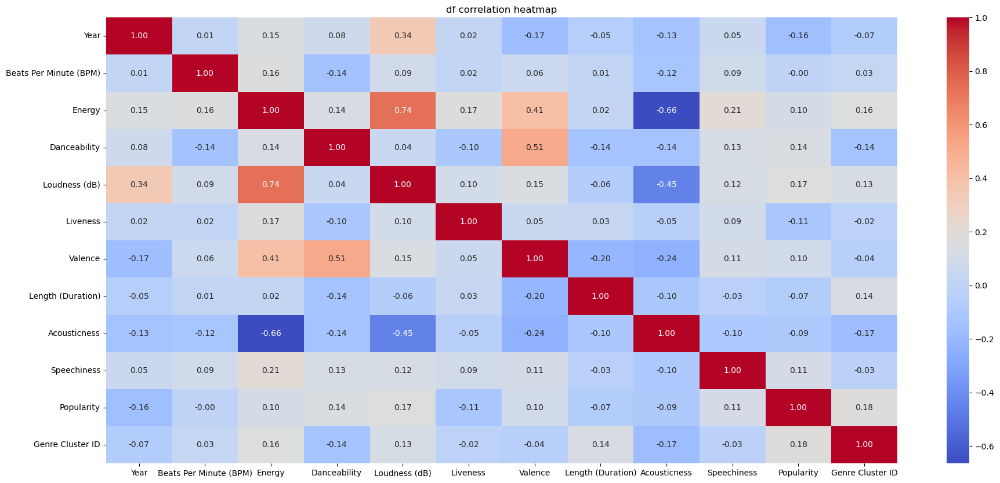

In [119]:
plt.figure(figsize=(22, 10))
plt.title('df correlation heatmap')
sns.heatmap(df[numeric_columns][1:].corr(), annot=True, cmap='coolwarm', cbar=True, fmt='.2f')
plt.show()

Most fields are not correlated to each other. The most correlated fields are 'Loudness (dB)' & 'Energy' and 'Acousticness' & 'Energy' and they have moderate correlations, not strong.

In [121]:
df['Top Genre'].value_counts(ascending=False).index[0]

'album rock'

In [122]:
df.loc[df['Top Genre']==df['Top Genre'].value_counts(ascending=False).index[0], ]

,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity,Genre Cluster ID,Genre Group
Index,,,,,,,,,,,,,,,,
2,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39,2,Rock
14,I'm going home,Ten Years After,album rock,2005,117,93,38,-2,81,40,639,18,10,26,2,Rock
32,Big Log - 2006 Remaster,Robert Plant,album rock,2007,181,59,56,-9,20,68,306,32,3,57,2,Rock
60,Goin To The Run,Golden Earring,album rock,2008,124,59,47,-8,28,18,236,42,3,38,2,Rock
68,In The Army Now,Status Quo,album rock,2002,105,73,68,-8,14,94,281,11,2,59,2,Rock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1977,Down On The Corner,Creedence Clearwater Revival,album rock,1969,108,54,86,-9,7,87,166,58,8,73,2,Rock
1980,Touch Me,The Doors,album rock,1969,109,90,43,-5,12,77,190,41,7,68,2,Rock
1982,Midnight Rambler,The Rolling Stones,album rock,1969,75,66,40,-10,17,51,413,77,12,50,2,Rock


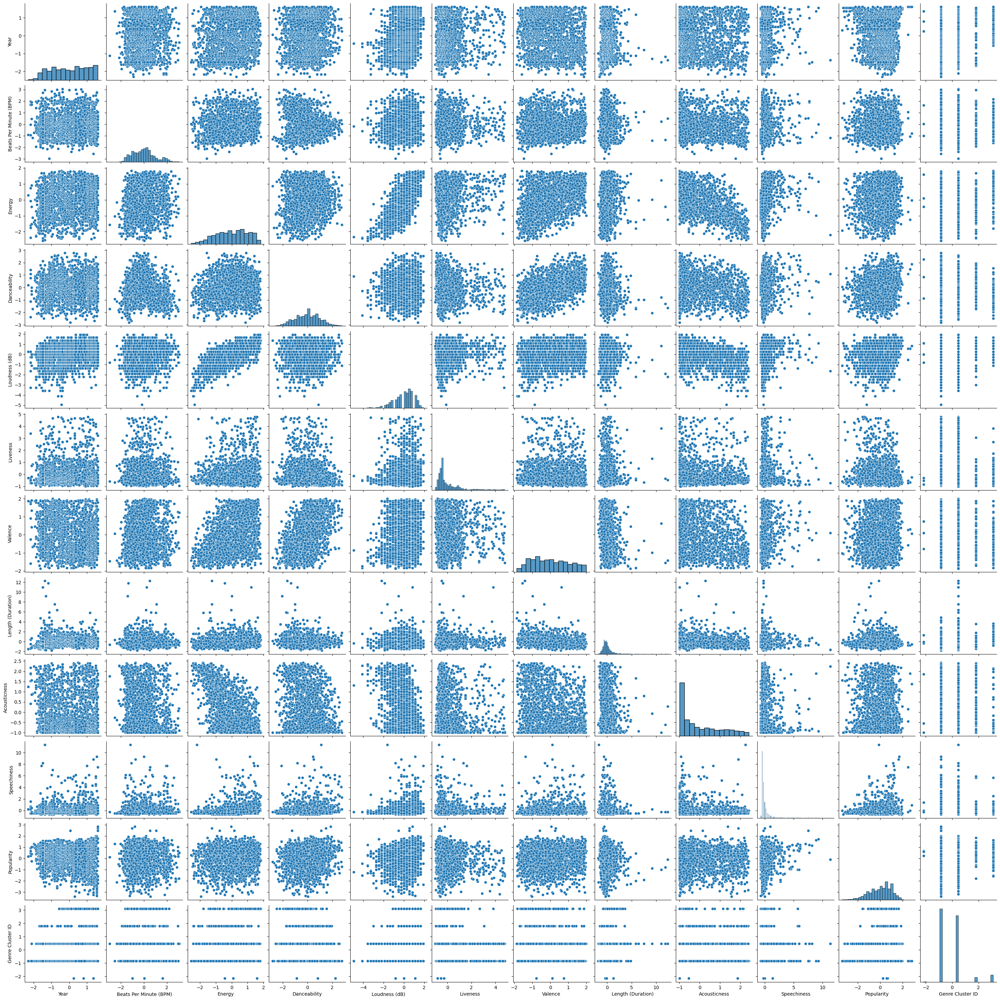

In [124]:
from sklearn.preprocessing import StandardScaler

original_df = df.copy()

# scaled_df = pd.DataFrame(StandardScaler().fit_transform(df[numeric_columns]), columns=numeric_columns)
# subset = df.loc[df['Top Genre']==df['Top Genre'].value_counts(ascending=False).index[0], ]
scaled_df = pd.DataFrame(StandardScaler().fit_transform(df[numeric_columns]), columns=numeric_columns)
sns.pairplot(scaled_df, kind='scatter')
plt.show()

## ML Premodeling

In [236]:
top_genres = df['Top Genre'].value_counts(ascending=False).nlargest(10).index
filtered_df = df[df['Top Genre'].isin(top_genres)].sort_values('Top Genre', ascending=False).reset_index(drop=True)
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1092 entries, 0 to 1091
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Title                   1092 non-null   object
 1   Artist                  1092 non-null   object
 2   Top Genre               1092 non-null   object
 3   Year                    1092 non-null   int64 
 4   Beats Per Minute (BPM)  1092 non-null   int64 
 5   Energy                  1092 non-null   int64 
 6   Danceability            1092 non-null   int64 
 7   Loudness (dB)           1092 non-null   int64 
 8   Liveness                1092 non-null   int64 
 9   Valence                 1092 non-null   int64 
 10  Length (Duration)       1092 non-null   int64 
 11  Acousticness            1092 non-null   int64 
 12  Speechiness             1092 non-null   int64 
 13  Popularity              1092 non-null   int64 
 14  Genre Cluster ID        1092 non-null   int64 
 15  Genr

In [238]:
classes = filtered_df['Top Genre'].unique()
classes

array(['dutch pop', 'dutch indie', 'dutch cabaret', 'dance rock',
       'dance pop', 'classic rock', 'alternative rock',
       'alternative metal', 'album rock', 'adult standards'], dtype=object)

Data is limited to the top ten genres in the dataset.

In [241]:
numeric_columns

['Year',
 'Beats Per Minute (BPM)',
 'Energy',
 'Danceability',
 'Loudness (dB)',
 'Liveness',
 'Valence',
 'Length (Duration)',
 'Acousticness',
 'Speechiness',
 'Popularity',
 'Genre Cluster ID']

In [243]:
X = filtered_df[numeric_columns[:-1]].to_numpy()
y = filtered_df["Top Genre"].to_numpy()

In [245]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)
y_test_bin = label_binarize(y_test, classes=np.unique(y_train))  # match classes seen during training

In [247]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

In [249]:
scaler = StandardScaler()

scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

In [251]:
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)  
y_train_resampled = encoder.fit_transform(y_train_resampled)

## Modeling


Logistic Regression
  Accuracy:  0.388
  Precision: 0.466
  Recall:    0.388
  F1 Score:  0.405
Classification Report:

                   precision    recall  f1-score   support

        dutch pop     0.4000    0.5714    0.4706        21
      dutch indie     0.7727    0.4359    0.5574        78
    dutch cabaret     0.2500    0.3125    0.2778        16
       dance rock     0.1500    0.1579    0.1538        19
        dance pop     0.1000    0.0833    0.0909        12
     classic rock     0.4211    0.4000    0.4103        20
 alternative rock     0.0714    0.1111    0.0870         9
alternative metal     0.1765    0.3000    0.2222        10
       album rock     0.3182    0.6364    0.4242        11
  adult standards     0.4783    0.4783    0.4783        23

         accuracy                         0.3881       219
        macro avg     0.3138    0.3487    0.3172       219
     weighted avg     0.4660    0.3881    0.4050       219



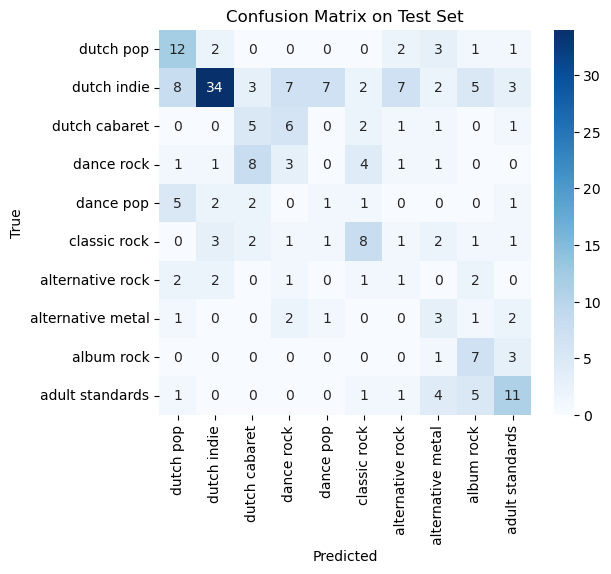


Decision Tree
  Accuracy:  0.406
  Precision: 0.418
  Recall:    0.406
  F1 Score:  0.410
Classification Report:

                   precision    recall  f1-score   support

        dutch pop     0.2857    0.2857    0.2857        21
      dutch indie     0.6164    0.5769    0.5960        78
    dutch cabaret     0.2222    0.2500    0.2353        16
       dance rock     0.3333    0.3158    0.3243        19
        dance pop     0.1250    0.0833    0.1000        12
     classic rock     0.4000    0.4000    0.4000        20
 alternative rock     0.0909    0.1111    0.1000         9
alternative metal     0.1875    0.3000    0.2308        10
       album rock     0.4000    0.5455    0.4615        11
  adult standards     0.4737    0.3913    0.4286        23

         accuracy                         0.4064       219
        macro avg     0.3135    0.3260    0.3162       219
     weighted avg     0.4176    0.4064    0.4099       219



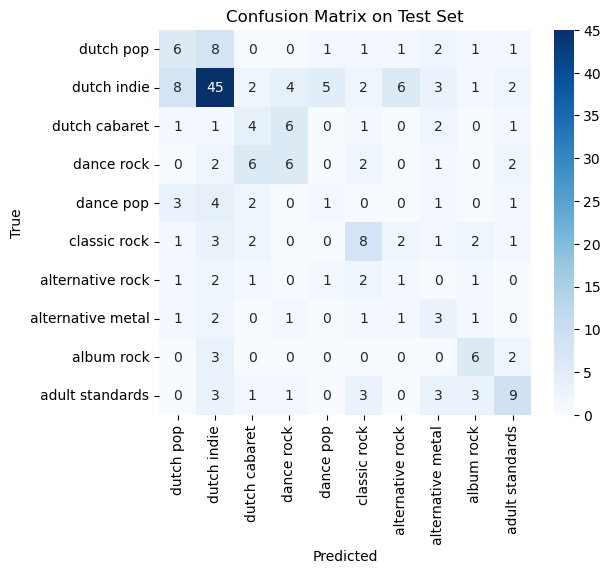


Random Forest
  Accuracy:  0.461
  Precision: 0.407
  Recall:    0.461
  F1 Score:  0.421
Classification Report:

                   precision    recall  f1-score   support

        dutch pop     0.3333    0.2381    0.2778        21
      dutch indie     0.5586    0.7949    0.6561        78
    dutch cabaret     0.2143    0.1875    0.2000        16
       dance rock     0.2667    0.2105    0.2353        19
        dance pop     0.0000    0.0000    0.0000        12
     classic rock     0.5625    0.4500    0.5000        20
 alternative rock     0.0000    0.0000    0.0000         9
alternative metal     0.4444    0.4000    0.4211        10
       album rock     0.2609    0.5455    0.3529        11
  adult standards     0.5000    0.3478    0.4103        23

         accuracy                         0.4612       219
        macro avg     0.3141    0.3174    0.3053       219
     weighted avg     0.4070    0.4612    0.4210       219



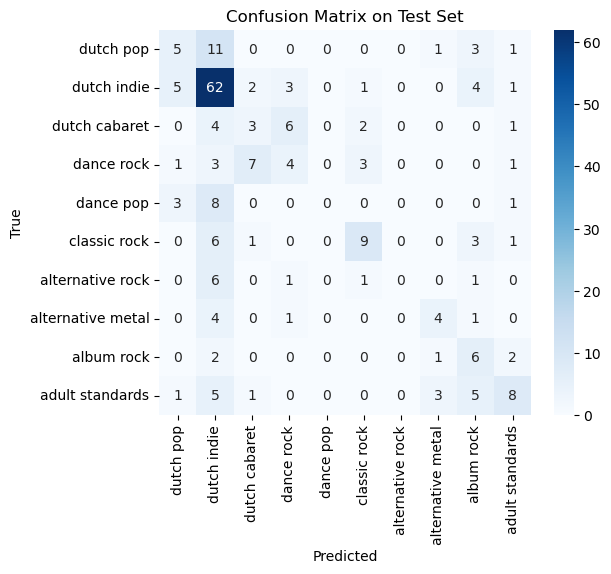


Gradient Boosting
  Accuracy:  0.420
  Precision: 0.357
  Recall:    0.420
  F1 Score:  0.379
Classification Report:

                   precision    recall  f1-score   support

        dutch pop     0.1538    0.0952    0.1176        21
      dutch indie     0.5273    0.7436    0.6170        78
    dutch cabaret     0.2727    0.1875    0.2222        16
       dance rock     0.2632    0.2632    0.2632        19
        dance pop     0.0000    0.0000    0.0000        12
     classic rock     0.4375    0.3500    0.3889        20
 alternative rock     0.0000    0.0000    0.0000         9
alternative metal     0.2500    0.2000    0.2222        10
       album rock     0.3529    0.5455    0.4286        11
  adult standards     0.4091    0.3913    0.4000        23

         accuracy                         0.4201       219
        macro avg     0.2667    0.2776    0.2660       219
     weighted avg     0.3574    0.4201    0.3793       219



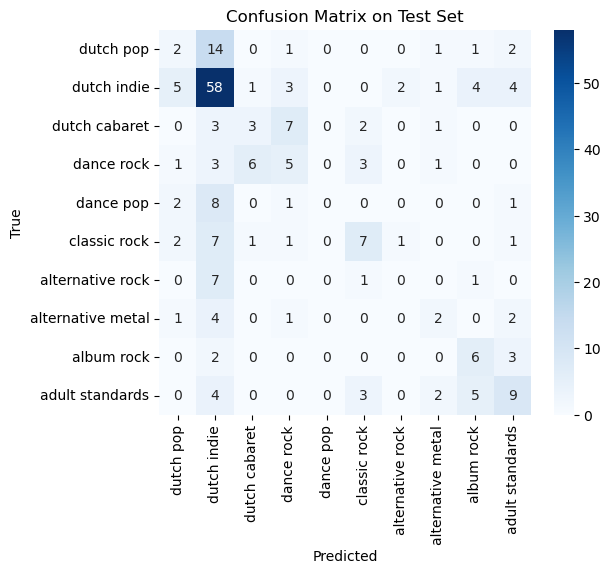

In [254]:
# Define Models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight='balanced'),
    "Decision Tree": DecisionTreeClassifier(random_state=42, class_weight='balanced'),
    "Random Forest": RandomForestClassifier(random_state=42, n_estimators=100, class_weight='balanced'),
    # GradientBoostingClassifier does NOT support class_weight directly
    "Gradient Boosting": GradientBoostingClassifier(random_state=42, n_estimators=100)
}
# Train & Evaluate
for name, model in models.items():
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    
    acc = accuracy_score(y_test, preds)
    precision = precision_score(y_test, preds, average='weighted')
    recall = recall_score(y_test, preds, average='weighted')
    f1 = f1_score(y_test, preds, average='weighted')

    print(f"\n{name}")
    print(f"  Accuracy:  {acc:.3f}")
    print(f"  Precision: {precision:.3f}")
    print(f"  Recall:    {recall:.3f}")
    print(f"  F1 Score:  {f1:.3f}")

    print("Classification Report:\n")
    print(classification_report(y_test, preds, digits=4, target_names=classes))
    
    # Confusion matrix
    cm = confusion_matrix(y_test, preds)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix on Test Set")
    plt.show()

### CatboostClassifier

The CatBoostClassifier requires a slightly different setup from the models above. 


CatBoost
  Accuracy:  0.470
  Precision: 0.418
  Recall:    0.470
  F1 Score:  0.435
Test AUC-ROC (CatBoost): 0.825
Classification Report:

                   precision    recall  f1-score   support

        dutch pop     0.3684    0.3333    0.3500        21
      dutch indie     0.5882    0.7692    0.6667        78
    dutch cabaret     0.3000    0.1875    0.2308        16
       dance rock     0.2143    0.1579    0.1818        19
        dance pop     0.0000    0.0000    0.0000        12
     classic rock     0.5882    0.5000    0.5405        20
 alternative rock     0.0000    0.0000    0.0000         9
alternative metal     0.3333    0.3000    0.3158        10
       album rock     0.2800    0.6364    0.3889        11
  adult standards     0.4762    0.4348    0.4545        23

         accuracy                         0.4703       219
        macro avg     0.3149    0.3319    0.3129       219
     weighted avg     0.4184    0.4703    0.4347       219



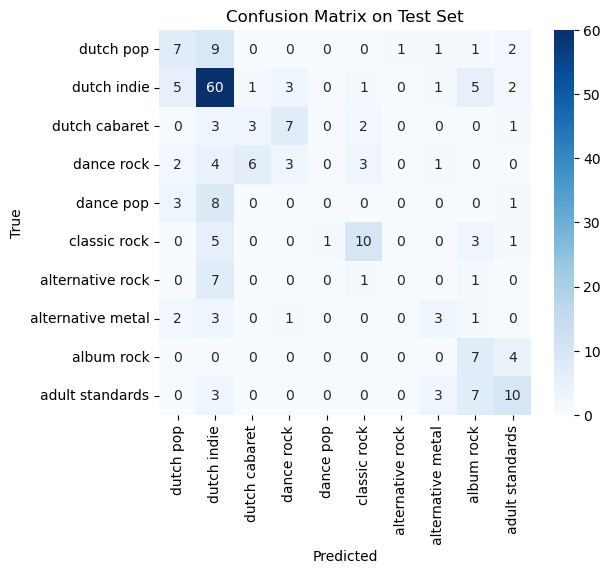

In [278]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(iterations=500, learning_rate=0.1,
                                                            depth=6,
                                                            eval_metric='AUC',
                                                            random_seed=42,
                                                            verbose=0)

start_time = time.time()
model.fit(X_train, y_train, early_stopping_rounds=100)
train_time = time.time() - start_time

preds = model.predict(X_test)

acc = accuracy_score(y_test, preds)
precision = precision_score(y_test, preds, average='weighted')
recall = recall_score(y_test, preds, average='weighted')
f1 = f1_score(y_test, preds, average='weighted')

print(f"\nCatBoost")
print(f"  Accuracy:  {acc:.3f}")
print(f"  Precision: {precision:.3f}")
print(f"  Recall:    {recall:.3f}")
print(f"  F1 Score:  {f1:.3f}")
probs_test = model.predict_proba(X_test)
auc = roc_auc_score(y_test_bin, probs_test, multi_class='ovr', average='weighted')
print("Test AUC-ROC (CatBoost):", round(auc, 3))

print("Classification Report:\n")
print(classification_report(y_test, preds, digits=4, target_names=classes))

# Confusion matrix
cm = confusion_matrix(y_test, preds)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix on Test Set")
plt.show()

### Models' Performance

In [276]:
# Store model performance results
performance_classification = []

performance_classification.append({# Adds CatBoost metrics before iterating
        "Model": 'CatBoostClassifier',
        "Accuracy": round(acc, 3),
        "F1 Score": round(f1, 3),
        "AUC-ROC" : round(auc, 3),
        "Training Time (s)": round(train_time, 4)
    })

for name, model in models.items():
    start_time = time.time()
    model.fit(X_train, y_train)
    train_time = time.time() - start_time

    preds_test = model.predict(X_test)
    probs_test = model.predict_proba(X_test)
    auc = roc_auc_score(y_test_bin, probs_test, multi_class='ovr', average='weighted')


    accuracy = accuracy_score(y_test, preds_test)
    f1 = f1_score(y_test, preds_test, average='weighted')  # use 'macro' or 'binary' if needed

    performance_classification.append({
        "Model": name,
        "Accuracy": round(accuracy, 3),
        "F1 Score": round(f1, 3),
        "AUC-ROC" : round(auc, 3),
        "Training Time (s)": round(train_time, 4)
    })

# Convert to DataFrame and sort by F1 Score
performance_df_classification = pd.DataFrame(performance_classification).sort_values(by="F1 Score", ascending=False)

# Display the performance
print("Model Speed and Quality (Classification):")
display(performance_df_classification)

Model Speed and Quality (Classification):


,Model,Accuracy,F1 Score,AUC-ROC,Training Time (s)
0,CatBoostClassifier,0.470,0.435,0.825,1.7358
3,Random Forest,0.461,0.421,0.837,0.2376
2,Decision Tree,0.406,0.410,0.649,0.0159
1,Logistic Regression,0.388,0.405,0.814,0.0336
4,Gradient Boosting,0.420,0.379,0.809,2.0802


In [187]:
import joblib

# Create the 'models' directory
os.makedirs("models", exist_ok=True)

joblib.dump(model, "models/genre_model.pkl")
joblib.dump(scaler, "models/scaler.pkl")
joblib.dump(encoder, "models/label_encoder.pkl")

# Create the 'data' directory
os.makedirs("data", exist_ok=True)

# Saving full processed DataFrame to CSV
df.to_csv("data/spotify_final.csv", index=False)


## Conclusions

- Several of the models demonstrate a probelmatic ability to distinguish between the various genres. This was expected given the class imbalances and the variety of classes for genres. Classification reports as well as confusion matrices were provided for all models for in-depth specific genre level comparison and performance. 
- Two features 'Genre Group' and 'Genre Cluster ID' were created from selctively gouping these genres. They offer the opportunity for a different kind of modeling and different results, but we did not have time to test their usefulness.
- All models' classification reports showed the highest aptitude in detecting the genre 'dutch indie'. 